In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# kita bikin 2 function yang bakalan sering di pake

In [3]:
def load_img():
    img = cv2.imread('/Users/clcx/Documents/GitHub/OpenCv-Deep-Learning/Pierian/DATA/bricks.jpg').astype(np.float32) / 255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [4]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

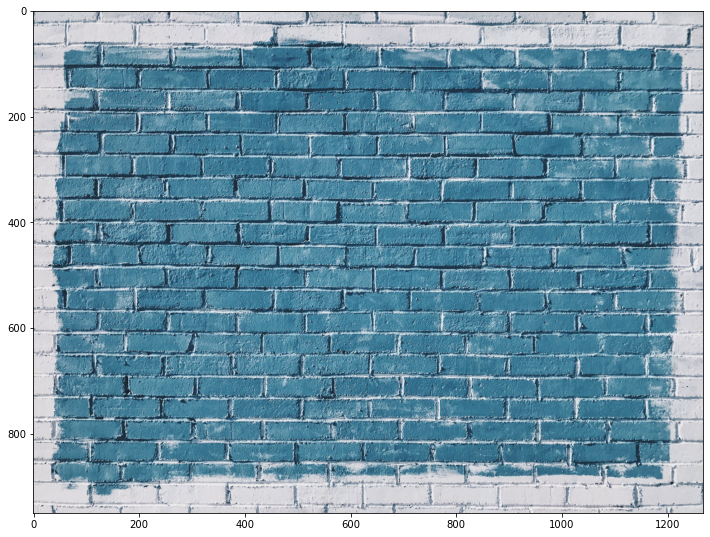

In [5]:
img = load_img()
display_img(img)

### Gamma Correction : Practical Effect of Increasing Brightness

jadi ini tujuannya buat ngatur brightness nya aja, ga buat blurring. makin gede gammanya makin gelap

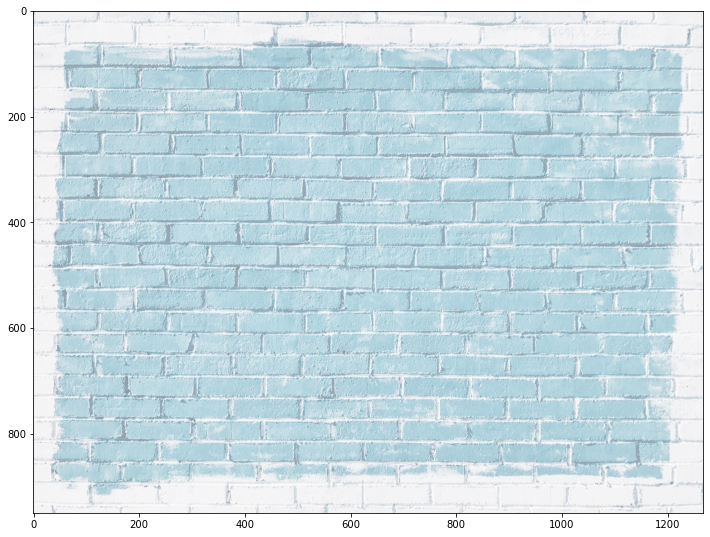

In [6]:
img = load_img()

# test gamma nya 1/4
gamma = 1/4

# pake np.power
effected_image = np.power(img,gamma)

display_img(effected_image)

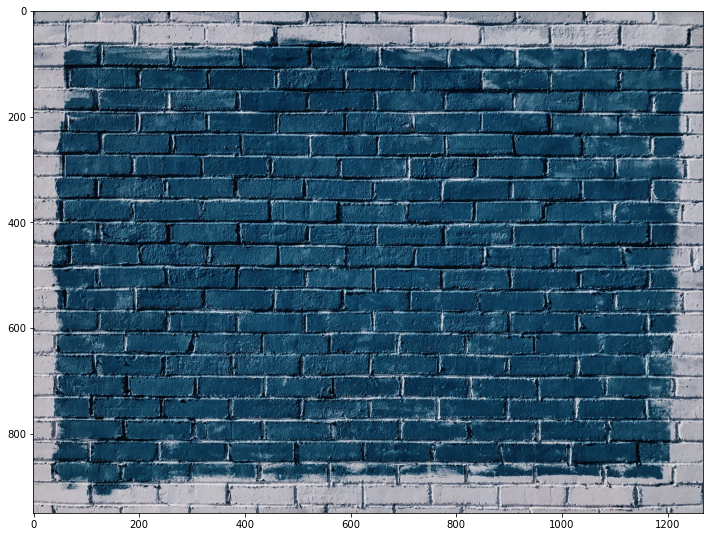

In [7]:
# coba gamma 2
img = load_img()
gamma = 2
effected_image = np.power(img,gamma)
display_img(effected_image)

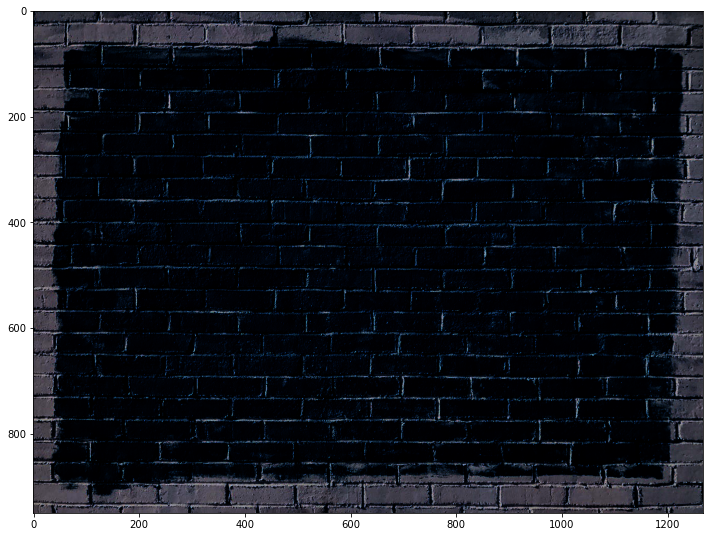

In [8]:
# coba gamma 8
img = load_img()
gamma = 8
effected_image = np.power(img,gamma)
display_img(effected_image)

### Low Pass Filter with a 2D Convolution

A fitlering operation known as 2D convolution can be used to create a low-pass filter. Make sure to view the video for an explanation of what's happening in the code below.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


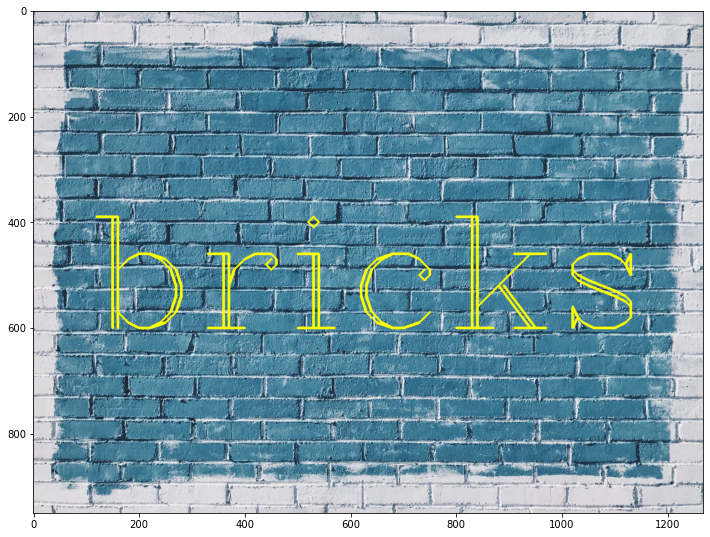

In [9]:
# kita pasang test di atas gambar bricks ini
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(100,600),fontFace=font,
fontScale=10,color=(255,255,0),thickness=4)
display_img(img)

In [10]:
### Create the Kernel

In [11]:
# kita buat kernel agak gede 5x5
kernel = np.ones(shape=(5,5),dtype=np.float32)/25

In [12]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


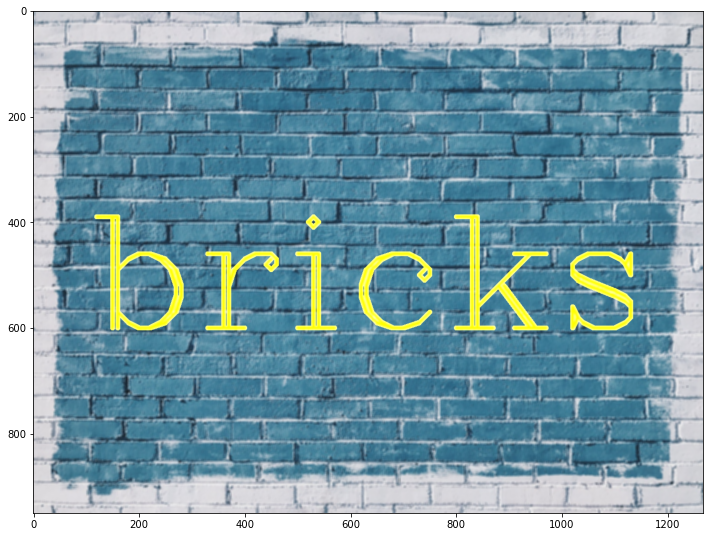

In [13]:
# biasa pake variable dst (destination)
# param kedua itu image depth
# biasa nya -1
dst = cv2.filter2D(img,-1,kernel)
display_img(dst)

### Averaging
pake fitur blur dari opencv

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


reset


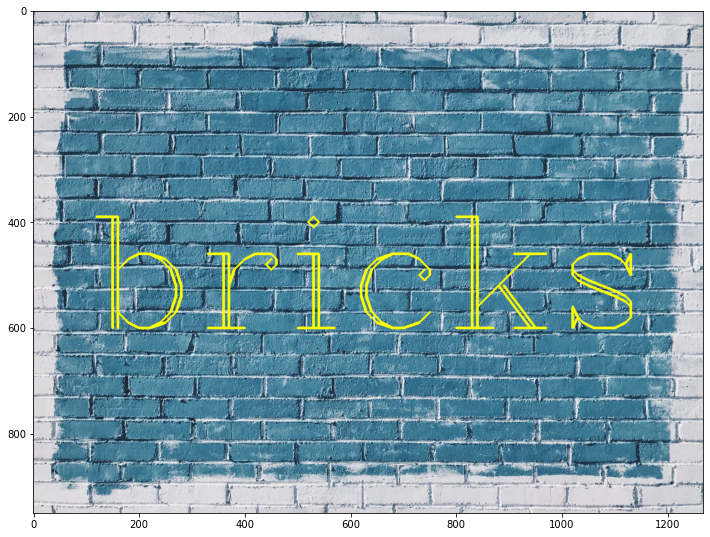

In [14]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(100,600),fontFace=font,
fontScale=10,color=(255,255,0),thickness=4)
display_img(img)
print('reset')

In [15]:
# tinggal cv2.blur terus masukin kernel size
blurred_img = cv2.blur(img,ksize=(5,5))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


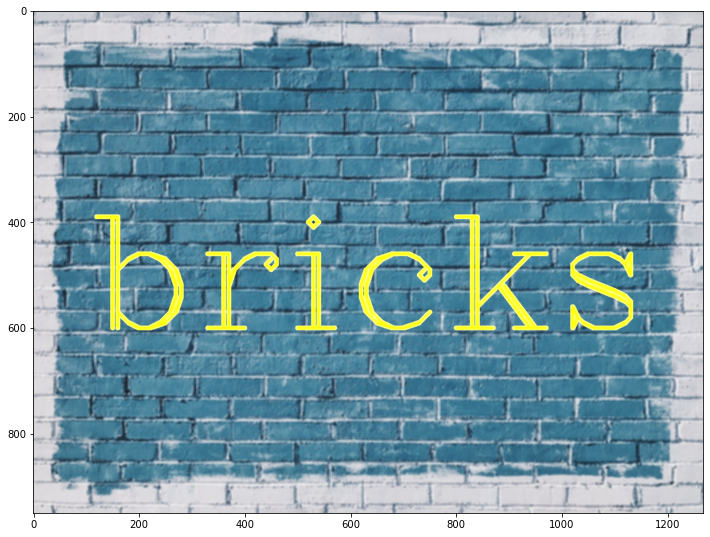

In [16]:
display_img(blurred_img)

### Gaussian Blurring

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


reset


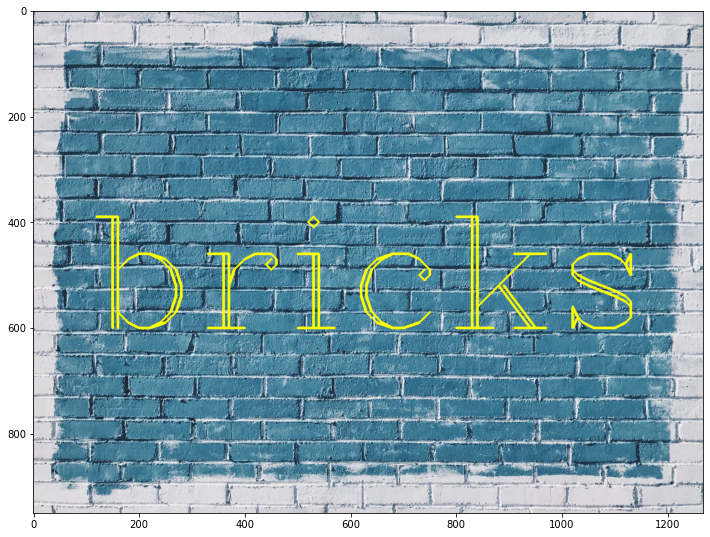

In [17]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(100,600),fontFace=font,
fontScale=10,color=(255,255,0),thickness=4)
display_img(img)
print('reset')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


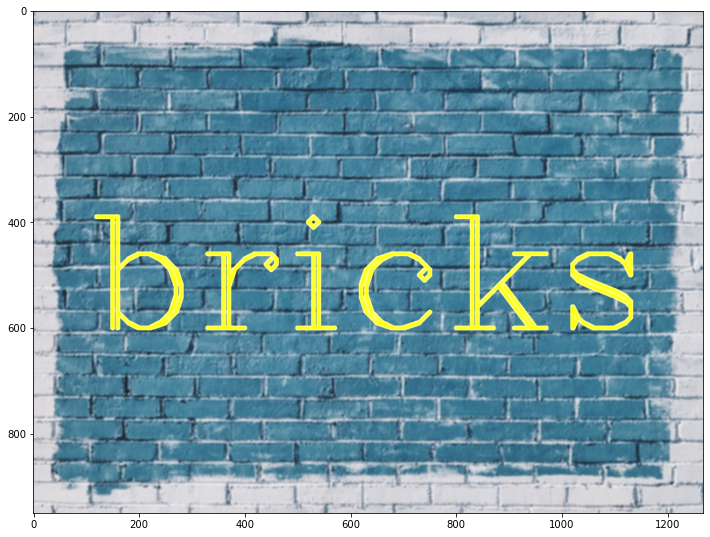

In [18]:
# sigmaX ama sigma Y biasa di samain jadi sigma X aja
blurred_img = cv2.GaussianBlur(img,(5,5),10)
display_img(blurred_img)

### Median Bluring
kalo ini blur yang bisa ngilangin noise dari sharpen detail2 edge nya juga

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


reset


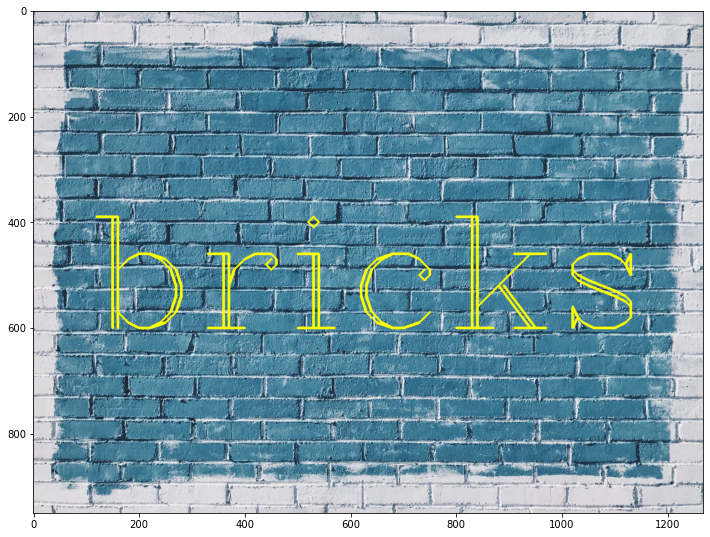

In [19]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(100,600),fontFace=font,
fontScale=10,color=(255,255,0),thickness=4)
display_img(img)
print('reset')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


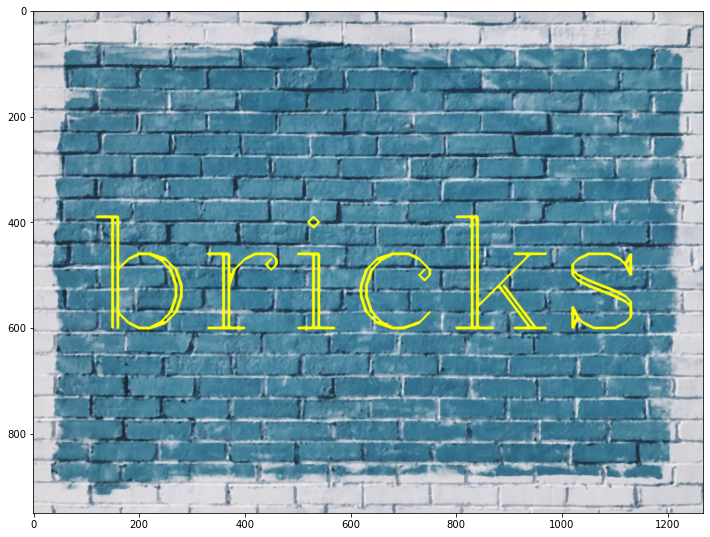

In [20]:
median = cv2.medianBlur(img,5)
display_img(median)
# bisa dilihat emang blur dikit noisenya ilang
# tapi font bricksnya masih jelas 

In [21]:
# skrg kita pake contoh foto anjing ini yang banyak noise

In [22]:
img = cv2.imread('/Users/clcx/Documents/GitHub/OpenCv-Deep-Learning/Pierian/DATA/sammy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [23]:
print(img.max())
print(img.min())
print(img.mean())
print(img.shape)

255
0
89.33081901499337
(1367, 1025, 3)


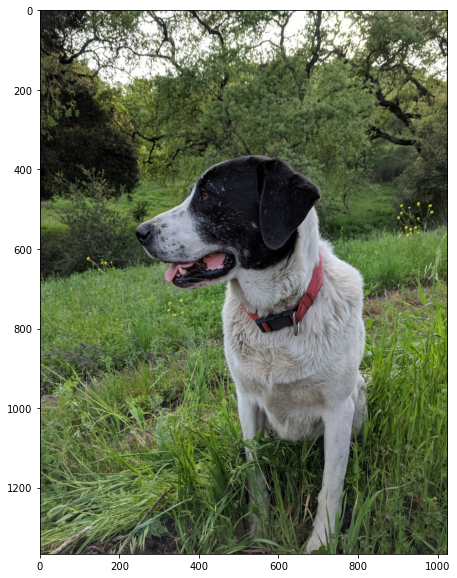

In [24]:
# ini versi aslinya
display_img(img)

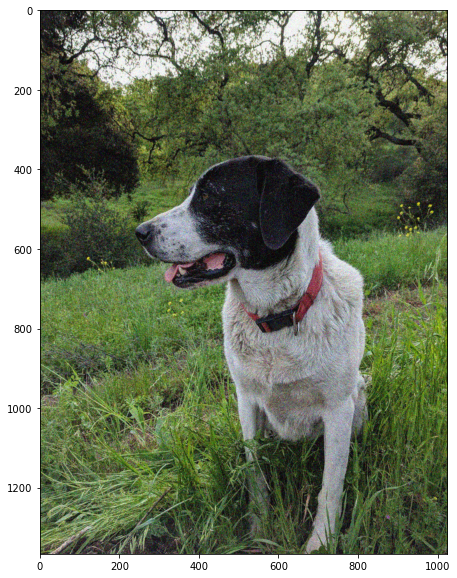

In [25]:
# ini versi noise nya
noise_img = cv2.imread('/Users/clcx/Documents/GitHub/OpenCv-Deep-Learning/Pierian/DATA/sammy_noise.jpg')
display_img(noise_img)

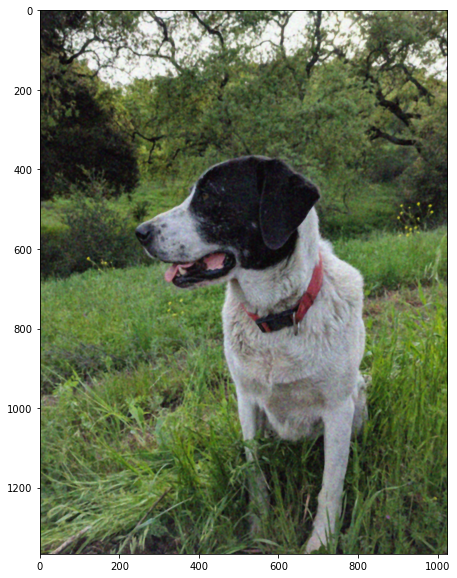

In [26]:
# coba pake median blur buat ilangin  noise
# biasa ksize nya emang 5
# jadi 5 dulu, baru naikin pelan2
median = cv2.medianBlur(noise_img,5)
display_img(median)

# walaupun agak blur, tapi lumayan bagus hasilnya
# noisenya ilang tapi ga blur2 bgt

### Bilateral Filtering
ini mirip kayak median, ilangin noise shapen edges juga, tapi ini lebih sharp

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


reset


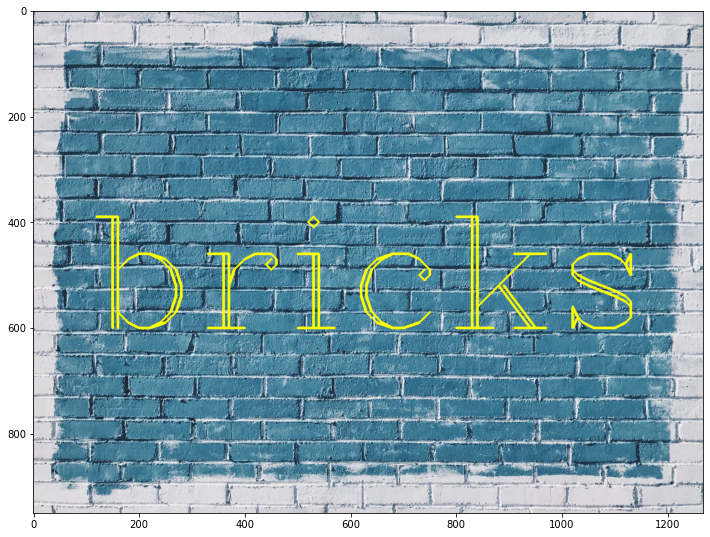

In [27]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(100,600),fontFace=font,
fontScale=10,color=(255,255,0),thickness=4)
display_img(img)
print('reset')

In [28]:
blur = cv2.bilateralFilter(img,9,75,75)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


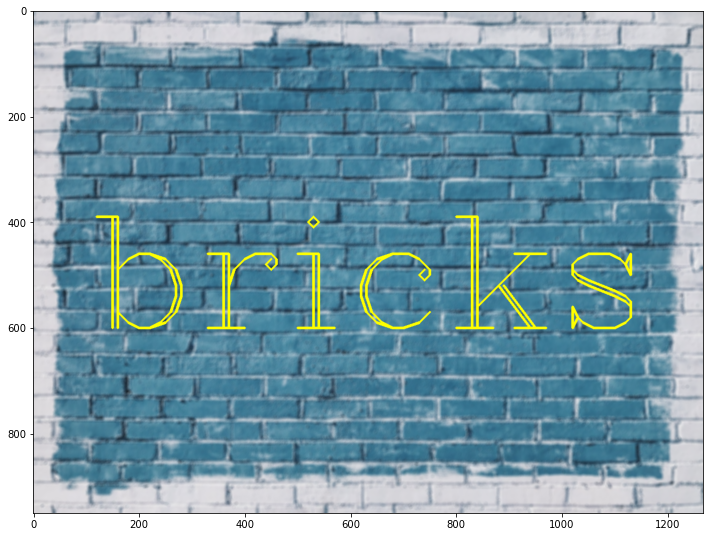

In [29]:
display_img(blur)
# masih jelas bgt tulisannya + sharp

In [32]:
help(cv2.bilateralFilter)

Help on built-in function bilateralFilter:

bilateralFilter(...)
    bilateralFilter(src, d, sigmaColor, sigmaSpace[, dst[, borderType]]) -> dst
    .   @brief Applies the bilateral filter to an image.
    .   
    .   The function applies bilateral filtering to the input image, as described in
    .   http://www.dai.ed.ac.uk/CVonline/LOCAL_COPIES/MANDUCHI1/Bilateral_Filtering.html
    .   bilateralFilter can reduce unwanted noise very well while keeping edges fairly sharp. However, it is
    .   very slow compared to most filters.
    .   
    .   _Sigma values_: For simplicity, you can set the 2 sigma values to be the same. If they are small (\<
    .   10), the filter will not have much effect, whereas if they are large (\> 150), they will have a very
    .   strong effect, making the image look "cartoonish".
    .   
    .   _Filter size_: Large filters (d \> 5) are very slow, so it is recommended to use d=5 for real-time
    .   applications, and perhaps d=9 for offline applicatio